# Initalize libraries

## Import libraries

In [1]:
import sys, os
import time
from os.path import join
from os import path
from importlib import reload
from getpass import getuser
from glob import glob

import xarray as xr
import h5py
from tqdm.auto import tqdm

sys.path.append("/asap3/petra3/gpfs/p04/2023/data/11016769/shared/Basic/library")
sys.path.append("/asap3/petra3/gpfs/p04/2023/data/11016769/shared/ck/library")

import numpy as np
import matplotlib.pyplot as plt

# Open nexus files
from nexusformat.nexus import *

# dask
import dask
import dask.array as da
from dask.distributed import Client

# pyFAI
import pyFAI
from pyFAI.azimuthalIntegrator import AzimuthalIntegrator
from pyFAI.detectors import Detector

# Self-written libraries
import reconstruct as reco
import fthcore as fth
import support_functions as sup
from interactive import cimshow, InteractiveCenter, AzimuthalIntegrationCenter

# Gifs
import imageio

from scipy import stats

plt.rcParams["figure.constrained_layout.use"] = True  # replaces plt.tight_layout

import reconstruct as reco
import reconstruct_rb as rec

In [404]:
# Is there a GPU?
try:
    # Cupy
    import cupy as cp
    import cupyx as cpx

    GPU = True

    print("GPU available")

    # Self-written library
    import CCI_core_cupy as cci
    import Phase_Retrieval as PhR
except:
    GPU = False
    import CCI_core as cci
    import Phase_Retrieval_noGPU as PhR

    print("GPU unavailable")

GPU available


In [405]:
# interactive plotting
import ipywidgets

%matplotlib widget

# Auto formatting of cells
%load_ext jupyter_black

The jupyter_black extension is already loaded. To reload it, use:
  %reload_ext jupyter_black


## Experiment specific Functions

In [406]:
PROPOSAL = 11016769
USER = getuser()

In [407]:
BASEFOLDER = "/asap3/petra3/gpfs/p04/2023/data/%s/" % PROPOSAL
subfolder = "nxs"


# Load image files
def load_images(im_id):
    fname = join(BASEFOLDER, "raw", subfolder, "2306_XPCS_%05d.nxs" % im_id)

    with nxload(fname) as f:
        im_out = np.array(f["scan"]["data"]["moench"][()])
        print("Loaded: %s (%d frames)" % (fname, im_out.shape[0]))
    return im_out.squeeze()


# Load any kind of data from collection
def load_collection(scan_id, field):
    fname = join(BASEFOLDER, "raw", subfolder, "2306_XPCS_%05d.nxs" % scan_id)

    with nxload(fname) as f:
        data = f["scan"]["instrument"]["collection"][field][()]
        print("Loaded: %s" % (fname))
    return data


# Full image loading procedure
def load_processing(im_id):
    # Load data
    images = load_images(im_id)

    # Zeropad to get square shape
    images = sup.padding(images)

    # Fill Infs and Nans in image and remove them
    print("Filling Infs and Nans...")
    images, nans_image = sup.fill_infs_nans(images)
    nans_image = np.any(nans_image, axis=(0))

    # Calculate mean
    print("Calculating mean...")
    image = np.mean(images, axis=0)

    return image, images, nans_image


# Load image files
def get_moench_id(scan_id):
    fname = join(BASEFOLDER, "raw", subfolder, "2306_XPCS_%05d.nxs" % scan_id)

    with nxload(fname) as f:
        moench_id = f["scan"]["data"]["fileindex"][()]
        print("Loaded: %s" % (fname))
    return np.array(moench_id)


def load_images_h5(moench_id):
    fname = join(BASEFOLDER, "raw", "moench", "%04d.h5" % moench_id)

    with h5py.File(fname, "r") as f:
        im_out = f["frames"][()]  # 3D matrix
    return im_out.squeeze()

In [408]:
# Worker which performs complete reconstruction process
def worker(image, topo):
    # Define reference image
    ref_image = topo[
        roi_im_reg[0] : roi_im_reg[1], roi_im_reg[2] : roi_im_reg[3]
    ].copy()

    # Alignment data
    offset_image = image[
        roi_im_reg[0] : roi_im_reg[1], roi_im_reg[2] : roi_im_reg[3]
    ].copy()

    # Calculate relative shift between image and topo
    shift = cci.image_registration(offset_image, ref_image)
    shift_c = np.array(topo.shape) / 2 - center

    # Shift arrays and apply beamstop
    topo_c = cci.shift_image(topo, shift_c)
    topo_b = topo_c * mask_bs
    im_c = cci.shift_image(image, shift_c)
    im_b = im_c * mask_bs

    # Calculate difference and sum hologram
    factor, offset = cci.dyn_factor(
        im_b,
        topo_b,
        method="correlation",
        print_out=False,
        plot=False,
    )
    diff_c = im_c - factor * topo_c - offset  # centered but without beamstop
    diff_b = im_b - factor * topo_b - offset  # centered with beamstop
    sum_c = im_c + factor * topo_c - offset  # centered but without beamstop
    sum_b = im_b + factor * topo_b - offset  # centered with beamstop

    # Do the reconstruction
    holo = diff_b.copy()
    recon = np.zeros(image.shape, dtype=np.complex_)

    # Reconstruct
    recon = cci.reconstruct(
        fth.propagate(holo, prop_dist * 1e-6, experimental_setup=experimental_setup)
        * np.exp(1j * phase)
    )

    # worker dictionary
    worker_dict = {}
    worker_dict["topo_centered"] = topo_c
    worker_dict["im_centered"] = im_c
    worker_dict["holo"] = holo
    worker_dict["recon"] = recon
    worker_dict["factor"] = factor
    worker_dict["offset"] = offset

    return worker_dict

# Experimental Details

In [409]:
# Dict with most basic experimental parameter
experimental_setup = {
    "ccd_dist": 0.30,  # ccd to sample distance
    "energy": 709,  # x-ray energy
    "px_size": 25e-6,  # pixel_size of camera
    "binning": 1,  # Camera binning
}

# Convert eV to wavelength
experimental_setup["lambda"] = cci.photon_energy_wavelength(
    experimental_setup["energy"], input_unit="eV"
)

# Setup for azimuthal integrator
detector = Detector(
    experimental_setup["binning"] * experimental_setup["px_size"],
    experimental_setup["binning"] * experimental_setup["px_size"],
)

# General saving folder
folder_general = sup.create_folder(join(BASEFOLDER, "processed"))
print("Output Folder: %s" % folder_general)

Folder: /asap3/petra3/gpfs/p04/2023/data/11016769/processed already exists!
Output Folder: /asap3/petra3/gpfs/p04/2023/data/11016769/processed


# Load images

Start by loading the images: image of interest (im), reference of charge scattering (topo), any kind of dark image (dark)

#We estalished the following convention: Difference Hologram which contains only the magnetic scattering will be calculated according to:

$Diff = Image - factor*Topo$,

where the factor is used for intensity scaling. In Case that you recorded scans of the same magnetic state with both helicities, use the image with negative helicity as topo and the one with positive helicity as image

In [988]:
# Define scan ids for each image
im_id = 1160
topo_id = 1159
dark_id = (
    "none"  # dark image, put in either id or if you don't have a dark image 'none'
)

print("Image Id: %s" % im_id)
print("Topo Id: %s" % topo_id)
print("Dark Id: %s" % dark_id)

Image Id: 1160
Topo Id: 1159
Dark Id: none


## Load image of interest

Loading images...
Loaded: /asap3/petra3/gpfs/p04/2023/data/11016769/raw/nxs/2306_XPCS_01160.nxs (2 frames)
No padding needed!
Filling Infs and Nans...
Calculating mean...


Text(0.5, 1.0, 'Avg Image with filled pixels')

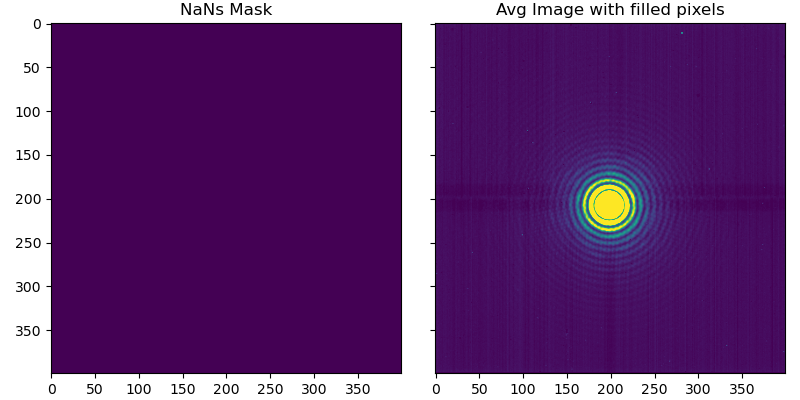

In [989]:
print("Loading images...")
# Load data
images = load_images(im_id)

# Zeropad to get square shape
images = sup.padding(images)

# Fill Infs and Nans in image and remove them
print("Filling Infs and Nans...")
images, nans_image = sup.fill_infs_nans(images)
nans_image = np.any(nans_image, axis=(0))

# Calculate mean
print("Calculating mean...")
image = np.mean(images, axis=0)

# Plot
mi, ma = np.nanpercentile(image, (1, 99))
fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(8, 4))
ax[0].imshow(nans_image)
ax[0].set_title("NaNs Mask")
ax[1].imshow(image, vmin=mi, vmax=ma)
ax[1].set_title("Avg Image with filled pixels")

## Load topo data set and average

Loading topo images...
Loaded: /asap3/petra3/gpfs/p04/2023/data/11016769/raw/nxs/2306_XPCS_01159.nxs (2 frames)
No padding needed!
Filling Infs and Nans...


Text(0.5, 1.0, 'Avg topo Image with filled pixels')

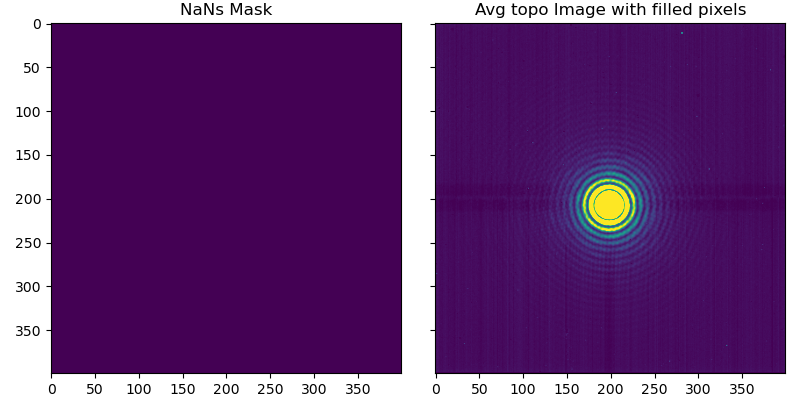

In [991]:
print("Loading topo images...")
# Load data
topo = np.mean(load_images(topo_id), axis=0)

# Zeropad to get square shape
topo = sup.padding(topo)

# Fill Infs and Nans in image and remove them
print("Filling Infs and Nans...")
topo, nans_topo = sup.fill_infs_nans(topo)

# Plot
mi, ma = np.nanpercentile(topo, (1, 99))
fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(8, 4))
ax[0].imshow(nans_topo)
ax[0].set_title("NaNs Mask")
ax[1].imshow(topo, vmin=mi, vmax=ma)
ax[1].set_title("Avg topo Image with filled pixels")

## Load dark

No padding needed!
No dark image loaded!


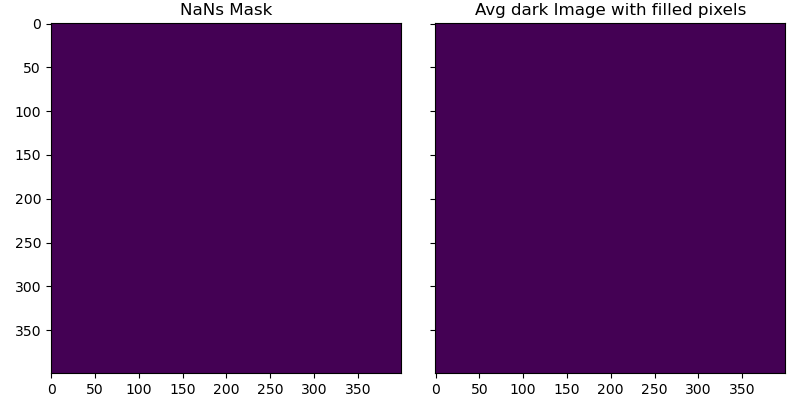

In [992]:
# Only load if specified
if dark_id == "none":
    if topo.ndim == 2:
        dark = np.zeros(topo.shape)
    elif topo.ndim == 3:
        dark = np.zeros((topo.shape[1], topo.shape[2]))
    dark = sup.padding(dark)
    nans_dark = np.zeros(dark.shape)
    print("No dark image loaded!")
else:
    dark = np.mean(load_images(dark_id))
    dark = sup.padding(dark)
    dark, nans_dark = sup.fill_infs_nans(dark)

# Plot
mi, ma = np.nanpercentile(dark, (1, 99))
fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(8, 4))
ax[0].imshow(nans_dark)
ax[0].set_title("NaNs Mask")
ax[1].imshow(dark, vmin=mi, vmax=ma)
ax[1].set_title("Avg dark Image with filled pixels")

# Subtract dark image
topo = topo - dark
image = image - dark

# Image Registration

Relative drift between data holograms and their corresponding topo holograms is calculated by image registration algorithm. Necessary to get well defined difference hologram. The reference is always the static background image (topo).  However, I use `phase_cross_correlation` from scikit-image which performs poorly in the subpixel regime 

## Set Alignment ROI

Set a region of interest (ROI) of reference (topo) use for image registration is performed. Don't select ROI which contains the beamstop as this leads to wrong results

How to use:
1. Zoom into the image and adjust your FOV until you are satisfied.
2. Save the axes coordinates.

interactive(children=(FloatRangeSlider(value=(0.0, 289609186.4480898), description='contrast', layout=Layout(w…

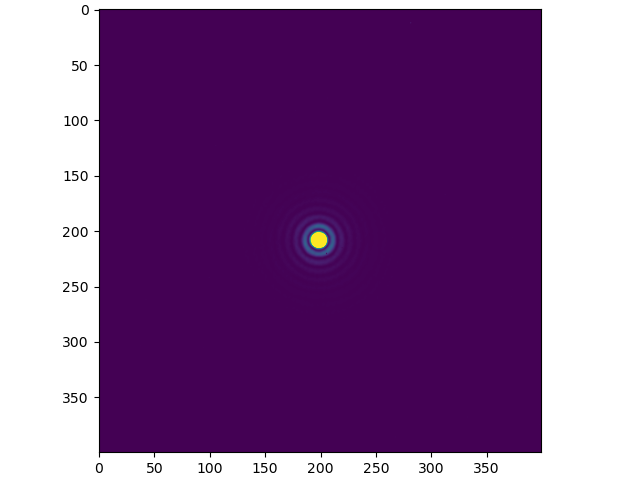

In [993]:
fig, ax = cimshow(image)

In [925]:
# Takes start and end of x and y axis
x1, x2 = ax.get_xlim()
y2, y1 = ax.get_ylim()
roi_im_reg = np.array([int(y1), int(y2), int(x1), int(x2)])

print(f"Image registration roi:", roi_im_reg)

Image registration roi: [  0 399   0 399]


## Calculate drift of images

In [926]:
# Define reference image (topo)
ref_image = topo[roi_im_reg[0] : roi_im_reg[1], roi_im_reg[2] : roi_im_reg[3]].copy()

# Alignment data
offset_image = image[
    roi_im_reg[0] : roi_im_reg[1], roi_im_reg[2] : roi_im_reg[3]
].copy()

# Calculate relative shift
shift = cci.image_registration(offset_image, ref_image)
print("Shift: %s" % str(shift))

Shift: [-0.01 -0.01]


In [994]:
# Set minor drift to zero?
if np.sum(np.abs(shift)) < 0.2:
    shift = [0, 0]
    print("Setting shift to zero!")

Setting shift to zero!


# Center holograms and apply beamstop

* Find center of the hologram to get a well-defined q-space. 
* Create smooth mask for beamstop or overexposed areas in direct beam

## Basic widget to find center

Try to **align** the circles to the **center of the scattering pattern**. Care! Position of beamstop might be misleading and not represent the actual center of the hologram. 

interactive(children=(FloatRangeSlider(value=(0.0, 302107466.72001845), description='contrast', layout=Layout(…

interactive(children=(IntText(value=200, description='c0', step=0), IntText(value=200, description='c1', step=…

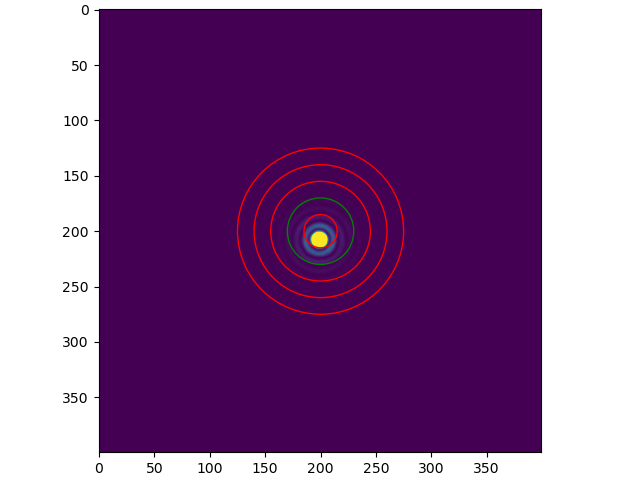

In [553]:
# Set center position via widget
ic = InteractiveCenter(image)

In [467]:
# Get center positions
center = [ic.c0, ic.c1]
print(f"Center:", center)
shift_c = np.array(image.shape) / 2 - center
print(f"Shift vector:", shift_c)

Center: [206, 199]
Shift vector: [-6.  1.]


### Azimuthal integrator widget for finetuning
More of an "expert widget" which works very well for alignment if you have an Airy Pattern as a scattering image. Transform image from carthesian into polar coordinate system with angle `phi` and radial distance `q` as axis (Azimuthal transformation). If the center is set correctly, all rings of the Airy pattern will be transformed into a straight line spanning of phi at a given q.  

In [827]:
# Setup azimuthal integrator for virtual geometry
ai = AzimuthalIntegrator(
    dist=experimental_setup["ccd_dist"],
    detector=detector,
    wavelength=experimental_setup["lambda"],
    poni1=center[0]
    * experimental_setup["px_size"]
    * experimental_setup["binning"],  # y (vertical)
    poni2=center[1]
    * experimental_setup["px_size"]
    * experimental_setup["binning"],  # x (horizontal)
)

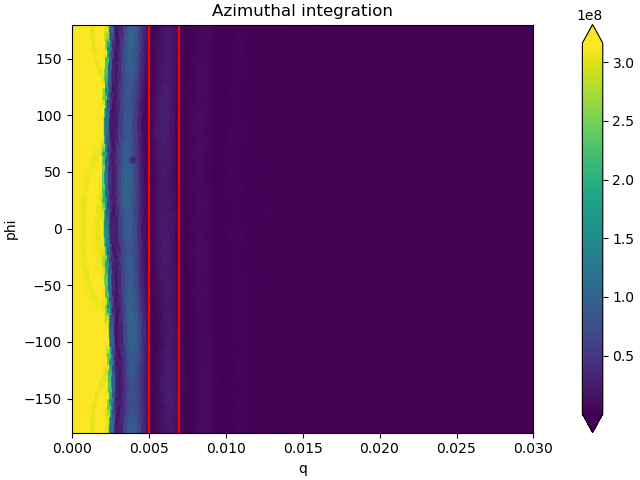

In [828]:
# Not the widget, just for double checking to find correct radial range

# Show some vertical lines at these qs
q_lines = [0.005, 0.007]

# Perform azimuthal transformation
I_t, q_t, phi_t = ai.integrate2d(
    image,
    500,  # number of points for phi
    radial_range=(0, 0.03),  # relevant q-range
    unit="q_nm^-1",
    correctSolidAngle=False,
)
# Combine in an xarray for plotting
az2d = xr.DataArray(I_t, dims=("phi", "q"), coords={"q": q_t, "phi": phi_t})

# Plot
fig, ax = plt.subplots()
mi, ma = np.percentile(I_t, [1, 95])
az2d.plot.imshow(ax=ax, vmin=mi, vmax=ma)
plt.title(f"Azimuthal integration")

# Vertical lines
for qt in q_lines:
    ax.axvline(qt, ymin=0, ymax=180, c="red")

interactive(children=(FloatSlider(value=209.0, description='y-center', max=400.0, step=0.25), FloatSlider(valu…

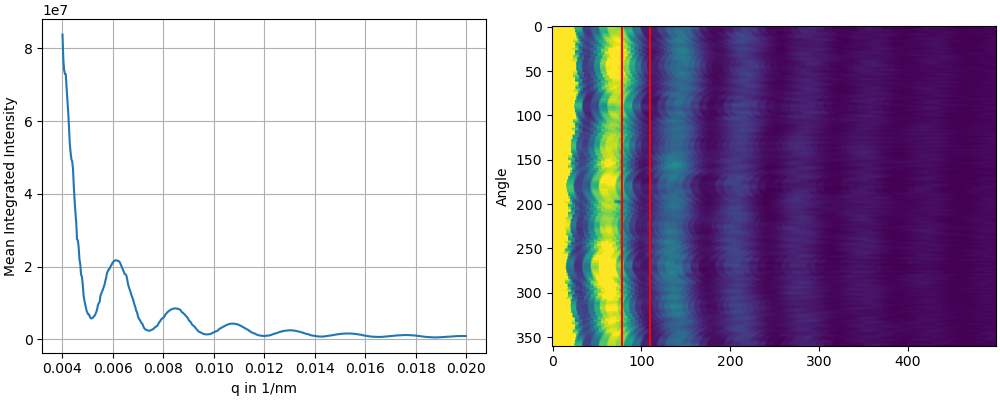

In [829]:
# The widget
aic = AzimuthalIntegrationCenter(
    image,
    ai,
    c0=center[0],
    c1=center[1],
    im_data_range=[1, 95],
    radial_range=(0.004, 0.02),
    qlines=[78, 110],
)

In [830]:
# Get center positions from widget
center = [aic.c0, aic.c1]
print(f"Center:", center)

Center: [208.0, 199.0]


## Here: Find best beamstop diameter

We want to cover the beamstop with a smooth circle to cover its sharp edges as these would create ringing-like artifacts in the reconstruction plane. Make it only as large as necessary to keep as much information as possible.

In [995]:
# Set beamstop diameter and std for smoothing filter.
# Higher values mean stronger smoothing.
# If you have a very small beamstop you might need to reduce the smoothing value.
# Otherwise the beamstop center won't mask the direct beam with zeros

bs_diam = 19
bs_smoothing = 2

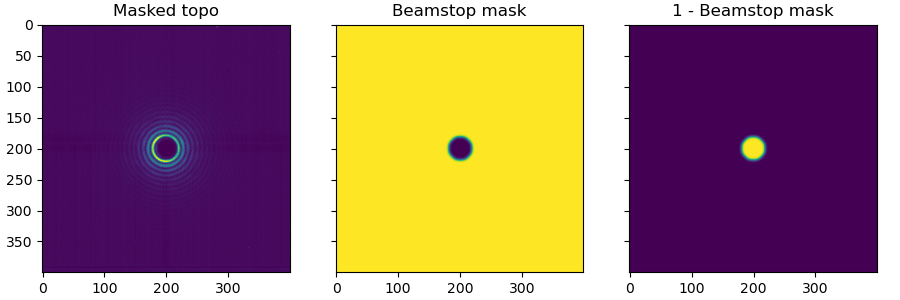

In [996]:
# Create beamstop mask
mask_bs = 1 - cci.circle_mask(
    topo.shape, np.array(topo.shape) / 2, bs_diam, sigma=bs_smoothing
)

# Shift and apply beamstop
shift_c = np.array(topo.shape) / 2 - center
topo_c = cci.shift_image(topo, shift_c + shift)
topo_b = topo_c * mask_bs

# Plot image with beamstop and valid pixel mask
fig, ax = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(9, 3))
mi, ma = np.percentile(topo_b[100:-100, 100:-100], [0.1, 99.9])
ax[0].imshow(topo_b, cmap="viridis", vmin=mi, vmax=ma)
ax[0].set_title("Masked topo")

ax[1].imshow(mask_bs)
ax[1].set_title("Beamstop mask")

ax[2].imshow(1 - mask_bs)
ax[2].set_title("1 - Beamstop mask")
plt.tight_layout()

## Center and apply beamstop to image

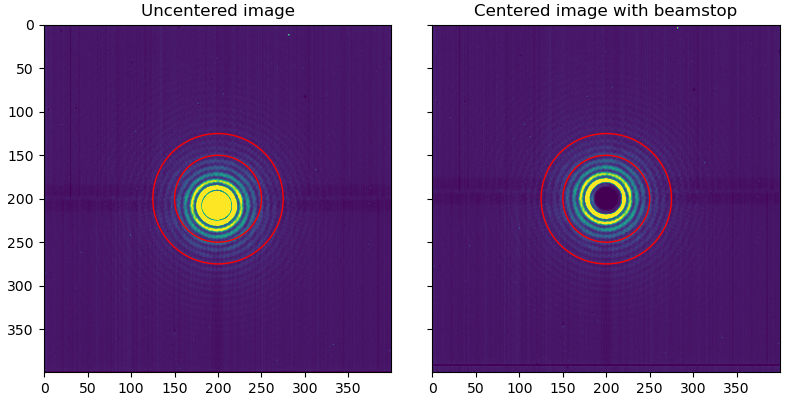

In [997]:
# Shift and apply beamstop
im_c = cci.shift_image(image, shift_c + shift)  # centered image
im_b = im_c * mask_bs  # centered image with beamstop

# Plot original and shifted holos
mi, ma = np.percentile(np.real(im_c[im_c != 0]), (0.1, 99))
fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(8, 4))
ax[0].imshow(np.real(image), cmap="viridis", vmin=mi, vmax=ma)
ax[0].set_title("Uncentered image")
ax[1].imshow(np.real(im_b), cmap="viridis", vmin=mi, vmax=ma)
ax[1].set_title("Centered image with beamstop")
plt.tight_layout()

# Add circles with different radi r
tmp = np.array(image.shape) / 2
for r in np.arange(50, 100, 25):
    ax[0].add_artist(plt.Circle((tmp[1], tmp[0]), r, fill=None, ec="red"))
    ax[1].add_artist(plt.Circle((tmp[1], tmp[0]), r, fill=None, ec="red"))

# Calculate difference holograms

You can see the reconstrution of the magnetization only after subtracting the large background that you get from the diffraction on the circular object aperture (Airy Pattern). This might require a scaling factor to correct intensity changes between the hologram and the topo. Scaling factor will be determined automatically by a linear fit. If the fit seems off, there might be an issue with the data

Linear Fit: 0.9697*x + 1457.6797
Done!
Done!


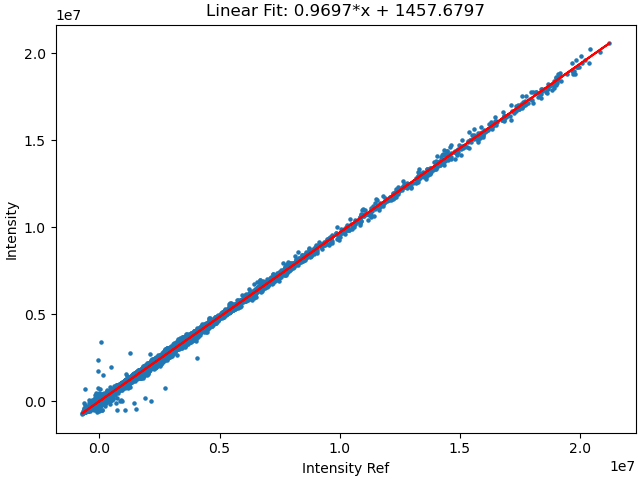

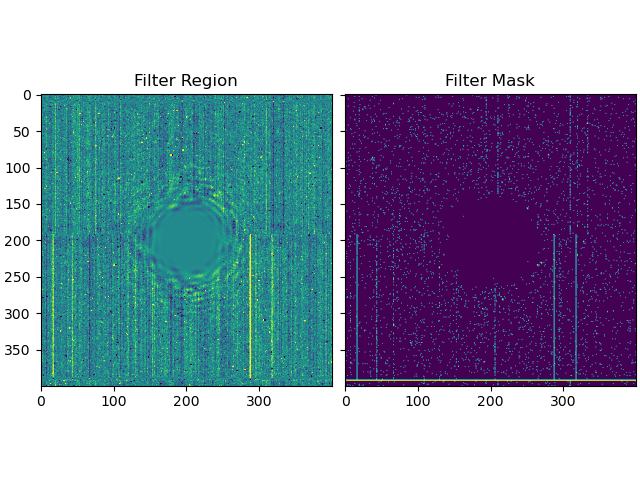

In [998]:
# Correct stripes
bg_up = im_c[7:13].mean(axis=0)
bg_low = im_c[int(shift_c[0] - 5) : int(shift_c[0] - 1), :].mean(axis=0)
mask_up = np.ones_like(image)
mask_up[int(200 + shift_c[0]) : int(shift_c[0])] = 0
mask_low = 1 - mask_up
im_c = im_c - bg_up * mask_up - bg_low * mask_low
im_b = im_b - bg_up * mask_up - bg_low * mask_low

bg_up = topo_c[7:13].mean(axis=0)
bg_low = topo_c[int(shift_c[0] - 5) : int(shift_c[0] - 1), :].mean(axis=0)
topo_c = topo_c - bg_up * mask_up - bg_low * mask_low
topo_b = topo_b - bg_up * mask_up - bg_low * mask_low

# Get scaling factor and offset
factor, offset = cci.dyn_factor(
    im_b,
    topo_b,
    method="correlation",
    print_out=True,
    plot=True,
)

# Calculate differences (magnetic) and sums (topographc) contrast holograms.
# _c: centered, without beamstop, _b: centered, with beamstop
diff_c = im_c - factor * topo_c - offset
diff_b = im_b - factor * topo_b - offset
sum_c = im_c + factor * topo_c - offset
sum_b = im_b + factor * topo_b - offset

# Filter hot pixels
holo_filter = diff_b.copy()
# holo_filter = holo_filter * (
#    1 - cci.circle_mask(image.shape, np.array(image.shape) / 2, 60, sigma=10)
# )
holo_filter = holo_filter * (
    1 - cci.circle_mask(image.shape, np.array(image.shape) / 2, 60, sigma=10)
)
mask_filter = np.abs(holo_filter) > 1e5
mask_filter = np.abs(holo_filter) > 5e4
mask_filter[int(shift_c[0]) - 1 : int(shift_c[0]) + 1] = True
diff_b[mask_filter] = 0
# diff_b[165, 204] = diff_b[162, 204]

fig, ax = plt.subplots(1, 2, sharex=True, sharey=True)
mi, ma = np.percentile(holo_filter, [1, 99])
ax[0].imshow(holo_filter, vmin=mi, vmax=ma)
ax[0].set_title("Filter Region")
ax[1].imshow(mask_filter)
ax[1].set_title("Filter Mask")
print("Done!")

print("Done!")

interactive(children=(FloatRangeSlider(value=(-218265.7963712392, 221393.2176127517), description='contrast', …

Text(0.5, 1.0, ' Diff Id 1160')

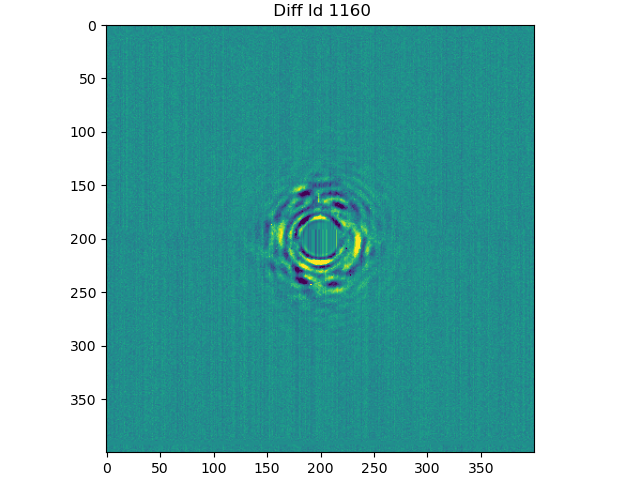

In [999]:
# Plot an example of the difference or sum hologram
fig, ax = cimshow(diff_b)
ax.set_title(f" Diff Id %d" % im_id)

# fig, ax = cimshow(sum_b)
# ax.set_title(f" Sum Id %d" % im_id)

# Reconstruct Diff Holos (FTH)

Reconstruct the hologramm.
1. Chose a region of interest (ROI) which means selecting one reconstruction from the rconstruction plane.
2. Propagate the image and shift the phase for maximal contrast and sharpness in your ROI
3. Optional finetuning with a widget

### Set Patterson Map ROI

Choose the reconstructions as the ROI.

1. Zoom into the image and adjust your FOV until you are satisfied.
2. Save the axes coordinates.

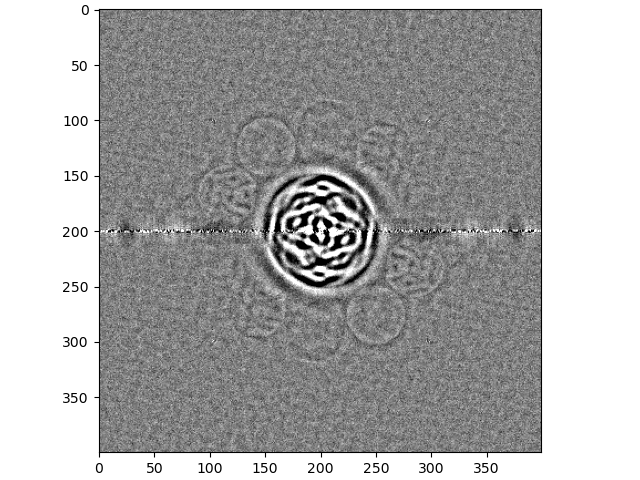

In [1000]:
fig, ax = plt.subplots()
tmp = np.real(cci.reconstruct(diff_b))  # magnetic contrast only
# tmp = np.real(cci.reconstruct(sum_b))  # topographic contrast only
# tmp = np.real(cci.reconstruct(im_b - topo_b)) #double checking if there is an issue with the scaling factor

mi, ma = np.percentile(tmp, [1, 99])
ax.imshow(tmp, vmin=mi, vmax=ma, cmap="gray")

In [1001]:
# Execute to get roi
x1, x2 = ax.get_xlim()
y2, y1 = ax.get_ylim()
roi = np.array([int(y1), int(y2), int(x1), int(x2)])  # ystart, ystop, xstart, xstop
roi = [75, 325, 71, 332]
roi_s = np.s_[roi[0] : roi[1], roi[2] : roi[3]]

print(f"Roi Reco:{roi}")

Roi Reco:[75, 325, 71, 332]


### Tune propagation and phase
Focus the image by tuning the propagation distance. This really works like focussing in a microscope.
Phase slider will move contrast between real and imaginary part. Usually we use the phase which maximizes the contrast in the real part

interactive(children=(FloatSlider(value=0.0, description='propagation[um]', layout=Layout(width='90%'), max=10…

Button(description='Finished', style=ButtonStyle())

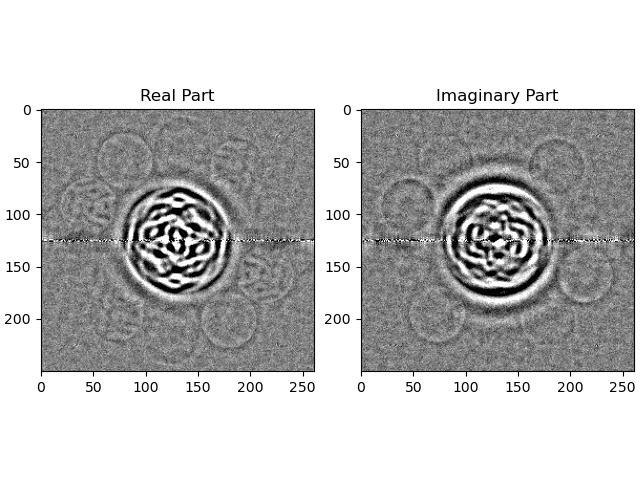

In [1002]:
# Widget.
slider_prop, slider_phase, button = reco.propagate(
    diff_b, roi_s, experimental_setup=experimental_setup, scale=(2, 98)
)

In [1003]:
# Read prop dist and phase from widget
prop_dist = slider_prop.value
phase = slider_phase.value

print(f"Propagation distance: %0.2f" % prop_dist)
print(f"Phase: %0.2f" % phase)

Propagation distance: 0.00
Phase: 0.00


## Widget for finetuning of shift and factor
You can try to find a better scaling factor and optimize the relative shift between image and topo hologram with this widget. Just execute, find your values and then execute next cell to update the values. 

interactive(children=(FloatSlider(value=0.969716855090953, description='tfactor', max=1.4, min=0.6, step=0.005…

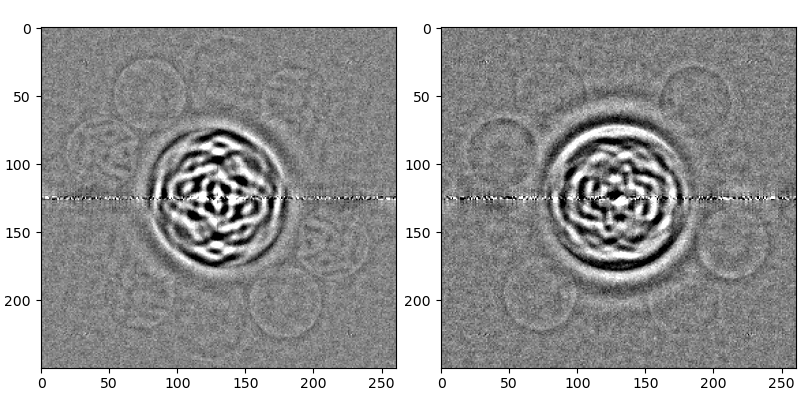

In [1006]:
# Ta-ke initial values
temp_holo = diff_b.copy()
temp_factor = factor
temp_shift = shift.copy()

# Open figure
fig, [ax, ax2] = plt.subplots(1, 2, figsize=(8, 4))
fig.tight_layout()

# Widget
layout = ipywidgets.Layout(width="90%")
opts = dict(layout=layout)


@ipywidgets.interact(
    tfactor=(0.6, 1.4, 0.005),  # slider ranges and step width for e.g. scaling variable
    xshift=(-1, 1, 0.01),
    yshift=(-1, 1, 0.01),
    options=opts,
)
def update(tfactor=factor, xshift=shift[1], yshift=shift[0]):  # initial values
    global temp_shift, temp_factor, temp_diff, temp_sum  # ugly writing as global variable

    # Couple widget only and global variables
    temp_shift = [xshift, yshift]
    temp_factor = tfactor

    # Calc diff and sum holo
    shifted = cci.shift_image(im_b, temp_shift)
    temp_diff = shifted - temp_factor * topo_b
    temp_sum = shifted + temp_factor * topo_b

    # Hotpixel filter
    temp_diff[np.abs(holo_filter) > 1e5] = 0

    # Reconstruction
    recon = cci.reconstruct(
        fth.propagate(
            temp_diff, prop_dist * 1e-6, experimental_setup=experimental_setup
        )
        * np.exp(1j * phase)
    )[roi[0] : roi[1], roi[2] : roi[3]]

    # Plots
    vmin, vmax = np.percentile(np.real(recon), (1, 99))
    ax.imshow(np.real(recon), vmin=vmin, vmax=vmax, cmap="gray")
    vmin, vmax = np.percentile(np.imag(recon), (1, 99))
    ax2.imshow(np.imag(recon), vmin=vmin, vmax=vmax, cmap="gray")

In [1007]:
# Copy values from widget
factor = temp_factor
shift = temp_shift
diff_b = temp_diff.copy()
sum_b = temp_sum.copy()

### Save reconstruction

Save png files of the images and a h5 file for all important variables

Saving: /asap3/petra3/gpfs/p04/2023/data/11016769/processed/Recon_ImId_1160_RefId_1159_cklose_diff.png


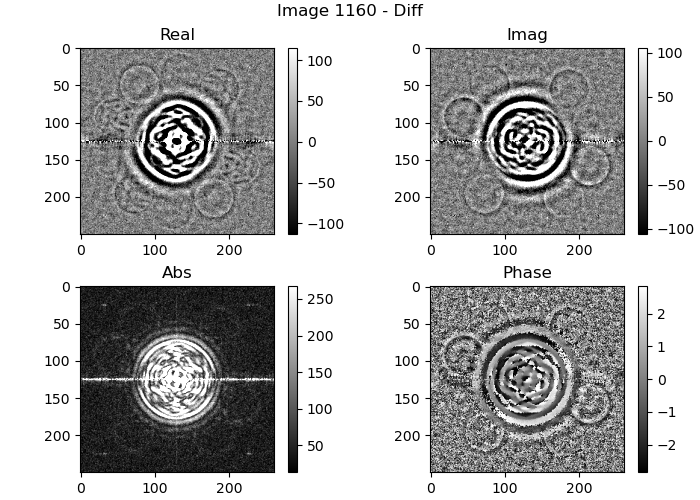

In [1008]:
# Setup variable
holo = diff_b.copy()
recon = np.zeros(image.shape, dtype=np.complex_)

# Reconstruct
recon = fth.reconstruct(
    fth.propagate(holo, prop_dist * 1e-6, experimental_setup=experimental_setup)
    * np.exp(1j * phase)
)

# Plot
fig, ax = plt.subplots(2, 2, figsize=(7, 5))
fig.suptitle("Image %d - Diff" % im_id)

# Real
vmin, vmax = np.percentile(np.real(recon[roi[0] : roi[1], roi[2] : roi[3]]), (5, 95))
t_im1 = ax[0, 0].imshow(
    np.real(recon[roi[0] : roi[1], roi[2] : roi[3]]), vmin=vmin, vmax=vmax, cmap="gray"
)
ax[0, 0].set_title("Real")
plt.colorbar(t_im1, ax=ax[0, 0])

# Imag
vmin, vmax = np.percentile(np.imag(recon[roi[0] : roi[1], roi[2] : roi[3]]), (5, 95))
t_im2 = ax[0, 1].imshow(
    np.imag(recon[roi[0] : roi[1], roi[2] : roi[3]]), vmin=vmin, vmax=vmax, cmap="gray"
)
ax[0, 1].set_title("Imag")
plt.colorbar(t_im2, ax=ax[0, 1])

# Abs
vmin, vmax = np.percentile(np.abs(recon[roi[0] : roi[1], roi[2] : roi[3]]), (5, 95))
t_im3 = ax[1, 0].imshow(
    np.abs(recon[roi[0] : roi[1], roi[2] : roi[3]]), vmin=vmin, vmax=vmax, cmap="gray"
)
ax[1, 0].set_title("Abs")
plt.colorbar(t_im3, ax=ax[1, 0])

# Angle
vmin, vmax = np.percentile(np.angle(recon[roi[0] : roi[1], roi[2] : roi[3]]), (5, 95))
t_im4 = ax[1, 1].imshow(
    np.angle(recon[roi[0] : roi[1], roi[2] : roi[3]]), vmin=vmin, vmax=vmax, cmap="gray"
)
ax[1, 1].set_title("Phase")
plt.colorbar(t_im4, ax=ax[1, 1])

# Save images
fname = join(
    folder_general, "Recon_ImId_%04d_RefId_%04d_%s_diff.png" % (im_id, topo_id, USER)
)
print("Saving: %s" % fname)
plt.savefig(fname, bbox_inches="tight", transparent=False)

Saving: /asap3/petra3/gpfs/p04/2023/data/11016769/processed/Recon_ImId_1160_RefId_1159_cklose_diff_small.png


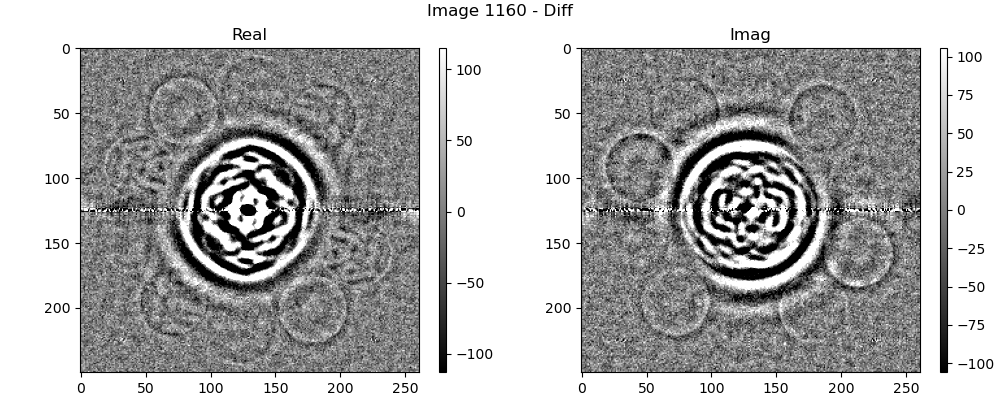

In [1014]:
# Saves only real and imaginary part
holo = diff_b.copy()
recon = np.zeros(image.shape, dtype=np.complex_)

# Reconstruct
recon = fth.reconstruct(
    fth.propagate(holo, prop_dist * 1e-6, experimental_setup=experimental_setup)
    * np.exp(1j * phase)
)

# Plot
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
fig.suptitle("Image %d - Diff" % im_id)

vmin, vmax = np.percentile(np.real(recon[roi[0] : roi[1], roi[2] : roi[3]]), (5, 95))
t_im1 = ax[0].imshow(
    np.real(recon[roi[0] : roi[1], roi[2] : roi[3]]), vmin=vmin, vmax=vmax, cmap="gray"
)
ax[0].set_title("Real")
plt.colorbar(t_im1, ax=ax[0], aspect=50)

vmin, vmax = np.percentile(np.imag(recon[roi[0] : roi[1], roi[2] : roi[3]]), (5, 95))
t_im2 = ax[1].imshow(
    np.imag(recon[roi[0] : roi[1], roi[2] : roi[3]]), vmin=vmin, vmax=vmax, cmap="gray"
)
ax[1].set_title("Imag")
plt.colorbar(t_im2, ax=ax[1], aspect=50)

# Save images
fname = join(
    folder_general,
    "Recon_ImId_%04d_RefId_%04d_%s_diff_small.png" % (im_id, topo_id, USER),
)
print("Saving: %s" % fname)
plt.savefig(fname, bbox_inches="tight", transparent=False)

In [1015]:
# Save h5
data = {}
data["im_id"] = im_id
data["topo_id"] = topo_id
data["topo_centered"] = topo_c
data["im_centered"] = im_c
data["holo"] = holo
data["sum_b"] = sum_b
data["recon"] = recon
data["factor"] = factor
data["offset"] = offset
data["center"] = center
data["roi"] = roi
data["prop_dist"] = prop_dist
data["phase"] = phase
data["mask_bs"] = mask_bs
data["bs_diam"] = bs_diam

filename = join(folder_general, "Data_ImId_%04d_RefId_%04d_%s" % (im_id, topo_id, USER))
print("Now Saving: %s" % filename)
cci.create_hdf5(data, filename)

Now Saving: /asap3/petra3/gpfs/p04/2023/data/11016769/processed/Data_ImId_1160_RefId_1159_cklose


In [1016]:
# Closes all existing plots
plt.close("all")

# CDI

In [1017]:
ttopo = sum_c.copy()
# ttopo = topo_c.copy()
pos = ttopo + diff_c
neg = ttopo - diff_c

interactive(children=(FloatRangeSlider(value=(-652028.9035833383, 36349361.732917055), description='contrast',…

(<Figure size 640x480 with 1 Axes>, <Axes: >)

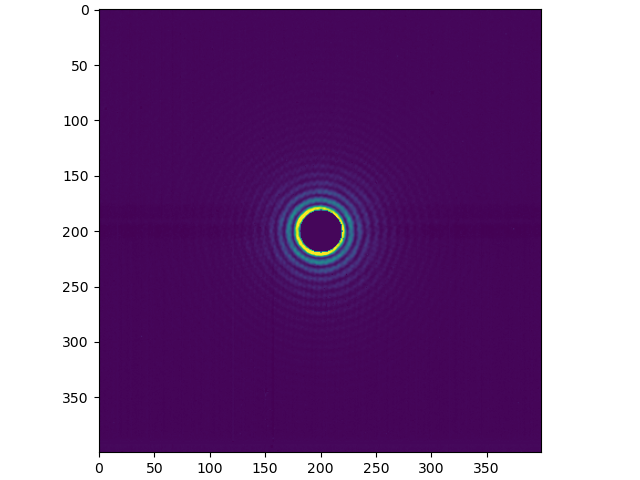

In [1018]:
# pos = im_c.copy()
# vmin, _ = np.percentile(pos, [10, 99])
pos = pos - np.mean(pos[0:10, :])
# neg = topo_c.copy()
neg = neg - np.mean(neg[0:10, :])

mask_pixel = cci.circle_mask(
    topo.shape, np.array(topo.shape) / 2, bs_diam, sigma="none"
)
mask_pixel = mask_pixel + mask_filter
# mask_pixel[392:, :] = 1

cimshow((pos) * (1 - mask_pixel))

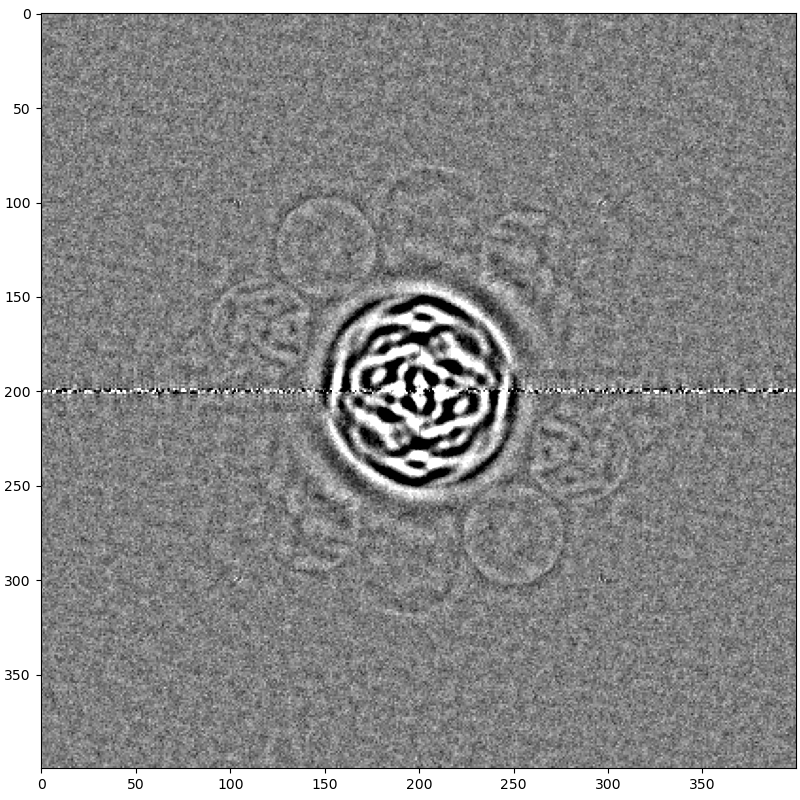

In [1019]:
# abs_val=pos2-neg2
abs_val = pos - neg
abs_val = abs_val * mask_bs * (1 - mask_pixel)
patterson = np.real(cci.reconstruct(abs_val))

fig, ax = plt.subplots(figsize=(8, 8))
mi, ma = np.percentile(patterson, (1, 99))
ax.imshow(patterson, vmin=mi, vmax=ma, cmap="gray")

### here

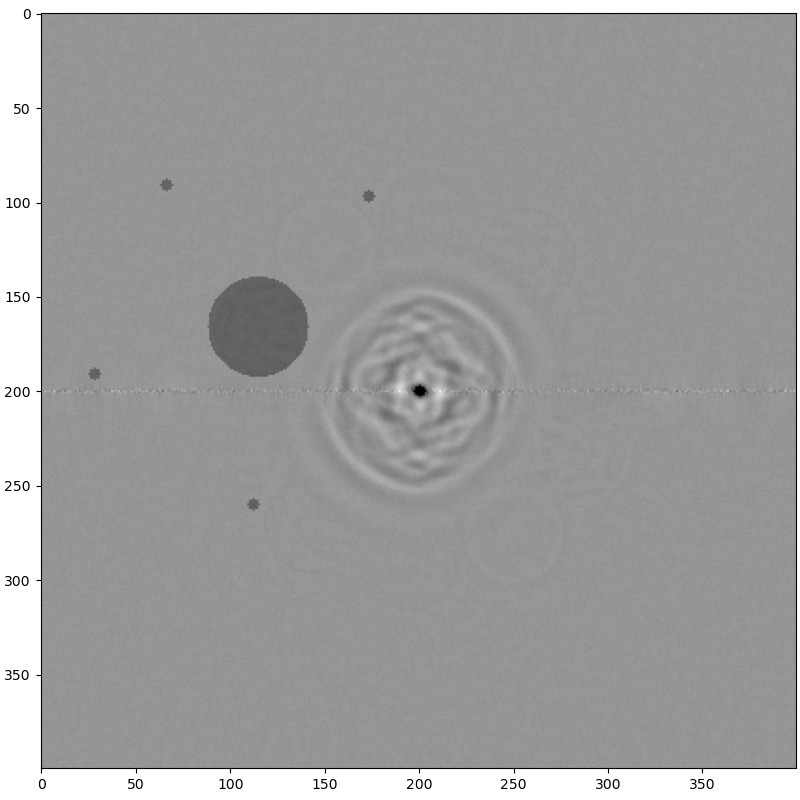

In [1020]:
# File name for loading
# fname = 'Supportmask_ScanID_%d-mask.edf'%285217#im_id[0]

# reload mask created with pyFAI-drawmask
# print('Now loading: %s'%join(maskpath,fname))
# supportmask = fabio.open(join(maskpath,fname)).data

# Add ref apertures
supportmask = np.zeros(pos.shape)
supportmask += cci.circle_mask(
    supportmask.shape, [supportmask.shape[0] / 2, supportmask.shape[1] / 2], 3
)
supportmask += cci.circle_mask(supportmask.shape, [260, 112], 3)
supportmask += cci.circle_mask(supportmask.shape, [97, 173], 3)
supportmask += cci.circle_mask(supportmask.shape, [91, 66], 3)
supportmask += cci.circle_mask(supportmask.shape, [191, 28], 3)

# Add obj aperture (good options here)
# supportmask += cci.circle_mask(supportmask.shape, [166, 114], 27)
# supportmask += cci.circle_mask(supportmask.shape, [166, 114], 28)
# supportmask += cci.circle_mask(supportmask.shape, [166, 113], 27)
# supportmask += cci.circle_mask(supportmask.shape, [166, 113.5], 26.5)
supportmask += cci.circle_mask(supportmask.shape, [166, 114.5], 26.5)

fig, ax = plt.subplots(figsize=(8, 8))
mi, ma = np.percentile(np.real(fth.reconstruct(sum_b)), (5, 95))
ax.imshow(
    # np.real(fth.reconstruct(pos * mask_bs - neg * mask_bs)),
    np.real(fth.reconstruct(diff_b)),
    vmin=mi,
    vmax=ma,
    cmap="gray",
)
ax.imshow(supportmask, alpha=0.2, cmap="binary")

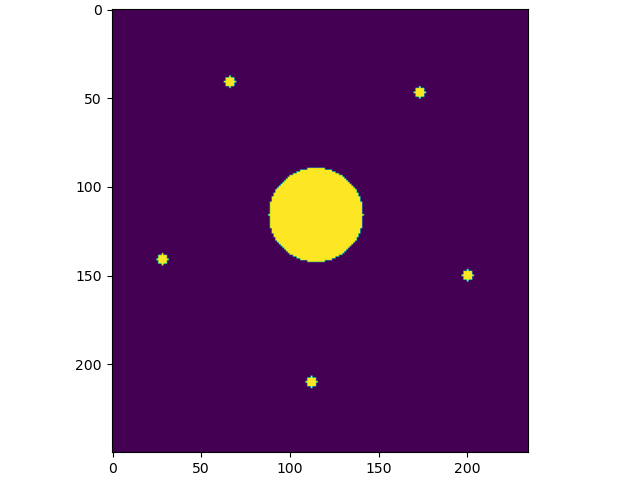

In [1021]:
roi_cdi = [50, 300, 0, 235]
roi_s = np.s_[roi_cdi[0] : roi_cdi[1], roi_cdi[2] : roi_cdi[3]]
fig, ax = plt.subplots()
ax.imshow(supportmask[roi_cdi[0] : roi_cdi[1], roi_cdi[2] : roi_cdi[3]])

### Execute

CDI - larger mask
############ -   CDI
--- 0.6686069965362549 seconds ---
############   -   CDI_pc


interactive(children=(FloatSlider(value=0.0, description='propagation[um]', layout=Layout(width='90%'), max=10…

--- 2.597001552581787 seconds ---


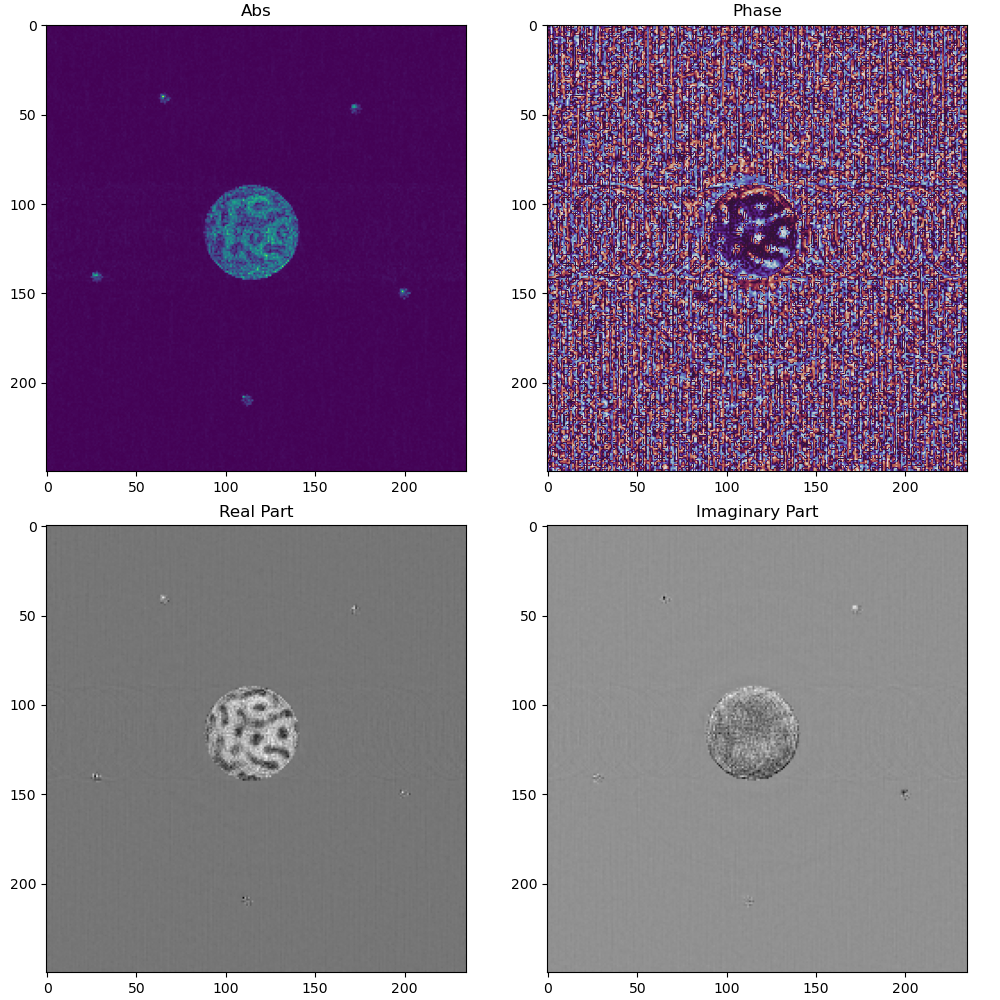

In [1022]:
pos2 = pos.copy()
neg2 = neg.copy()

mi, _ = np.percentile(pos2[pos2 != 0], [1, 99.9])
pos2 = pos2 - mi
mi, _ = np.percentile(neg2[neg2 != 0], [1, 99.9])
neg2 = neg2 - mi

pos2[pos2 < 0] = 0
neg2[neg2 < 0] = 0

bsmask_p = mask_pixel.copy()
bsmask_p[pos2 <= 2] = 1
bsmask_n = mask_pixel.copy()
bsmask_n[neg2 <= 2] = 1

# phase retrieval
phase = -0.35  # + np.pi
# prop_dist = 0data['prop_dist'].values
dx = 0
dy = 0

retrieved_p = np.zeros(pos2.shape, np.cdouble)
retrieved_n = np.zeros(pos2.shape, np.cdouble)

pos2 = pos2.astype(complex)
neg2 = neg2.astype(complex)

plt.rcParams["figure.dpi"] = 100
print("CDI - larger mask")

algorithm_list = ["mine", "mine", "mine"]
Nit_list = [700, 50, 50]  # iterations for algorithm_list

Startimage = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(supportmask)))
x = (np.sqrt(np.maximum(pos2, np.zeros(pos2.shape)))[mask_pixel == 0]).flatten()
y = ((np.abs(Startimage))[mask_pixel == 0]).flatten()
res = stats.linregress(x, y)
Startimage -= res.intercept
Startimage /= res.slope

average_img = 30
real_object = False  # always set to False

partial_coherence = True
if partial_coherence:
    Startgamma = np.ones(pos2.shape) * 1e-6 * 2
    Startgamma[pos2.shape[0] // 2, pos2.shape[1] // 2] = 0.7
    RL_freq = 20
    RL_it = 50

    algorithm_list_pc = ["mine", "ER", "ER"]
    Nit_list_pc = [700, 50, 50]


start_time = time.time()

for i in range(len(Nit_list) // 3):
    print("############ -   CDI")

    retrieved_p, Error_diff_p, Error_supp = PhR.PhaseRtrv_GPU(
        diffract=np.sqrt(np.maximum(pos2, np.zeros(pos2.shape))),
        mask=supportmask,
        mode=algorithm_list[3 * i],
        beta_zero=0.5,
        Nit=Nit_list[3 * i],
        beta_mode="arctan",
        plot_every=349,
        Phase=Startimage,
        seed=False,
        real_object=real_object,
        bsmask=bsmask_p,
        average_img=average_img,
        Fourier_last=True,
    )
    # print(retrieved_p[0,0])

    retrieved_p, Error_diff_p2, Error_supp = PhR.PhaseRtrv_GPU(
        diffract=np.sqrt(np.maximum(pos2, np.zeros(pos2.shape))),
        mask=supportmask,
        mode=algorithm_list[3 * i + 1],
        beta_zero=0.5,
        Nit=Nit_list[3 * i + 1],
        beta_mode="const",
        plot_every=24,
        Phase=retrieved_p,
        seed=False,
        real_object=real_object,
        bsmask=bsmask_p,
        average_img=average_img,
        Fourier_last=True,
    )
    # print(retrieved_p[0,0])

    retrieved_n, Error_diff_n2, Error_supp = PhR.PhaseRtrv_GPU(
        diffract=np.sqrt(np.maximum(neg2, np.zeros(neg2.shape))),
        mask=supportmask,
        mode=algorithm_list[3 * i + 2],
        beta_zero=0.5,
        Nit=Nit_list[3 * i + 2],
        beta_mode="const",
        plot_every=24,
        Phase=retrieved_p * np.sqrt(np.sum(neg2) / np.sum(pos2)),
        seed=False,
        real_object=real_object,
        bsmask=bsmask_n,
        average_img=average_img,
        Fourier_last=True,
    )
    # print(retrieved_n[0,0])

    print("--- %s seconds ---" % (time.time() - start_time))

    # mode = "-"
    # slider_prop, slider_phase, slider_dx, slider_dy = rec.focusCDI(
    #    retrieved_p,
    #    retrieved_n,
    #    roi=np.transpose(roi_s),
    #    mask=supportmask,
    #    phase=phase,
    #    prop_dist=prop_dist,
    #    experimental_setup=experimental_setup,
    #    operation=mode,
    #    max_prop_dist=10,
    # )
    #
    Startimage = retrieved_p.copy()

    if partial_coherence:
        # CDI_PC
        print("############   -   CDI_pc")
        pos3 = (np.abs(retrieved_p) ** 2) * bsmask_p + np.maximum(
            pos2, np.zeros(pos2.shape)
        ) * (1 - bsmask_p)
        neg3 = (np.abs(retrieved_n) ** 2) * bsmask_n + np.maximum(
            neg2, np.zeros(neg2.shape)
        ) * (1 - bsmask_n)

        # retrieve pos image
        retrieved_p_pc, Error_diff_p_pc, Error_supp, gamma_p = PhR.PhaseRtrv_with_RL(
            diffract=np.sqrt(pos3),
            mask=supportmask,
            mode=algorithm_list_pc[3 * i],
            beta_zero=0.5,
            Nit=Nit_list_pc[3 * i],
            beta_mode="arctan",
            gamma=Startgamma,
            RL_freq=RL_freq,
            RL_it=RL_it,
            plot_every=349,
            Phase=Startimage,
            seed=False,
            real_object=False,
            bsmask=np.zeros(bsmask_p.shape),
            average_img=average_img,
            Fourier_last=True,
        )

        retrieved_p_pc, Error_diff_p_pc2, Error_supp, gamma_p = PhR.PhaseRtrv_with_RL(
            diffract=np.sqrt(pos3),
            mask=supportmask,
            mode=algorithm_list[3 * i + 1],
            beta_zero=0.5,
            Nit=Nit_list_pc[3 * i + 1],
            beta_mode="const",
            gamma=gamma_p,
            RL_freq=RL_freq,
            RL_it=RL_it,
            plot_every=24,
            Phase=retrieved_p_pc,
            real_object=False,
            bsmask=np.zeros(bsmask_p.shape),
            average_img=average_img,
            Fourier_last=True,
        )
        retrieved_n_pc, Error_diff_n_pc2, Error_supp, gamma_n = PhR.PhaseRtrv_with_RL(
            diffract=np.sqrt(neg3),
            mask=supportmask,
            mode=algorithm_list[3 * i + 2],
            beta_zero=0.5,
            Nit=Nit_list_pc[3 * i + 2],
            beta_mode="const",
            gamma=gamma_p,
            RL_freq=RL_freq,
            RL_it=RL_it,
            plot_every=24,
            Phase=retrieved_p_pc * np.sqrt(np.sum(neg2) / np.sum(pos2)),
            real_object=False,
            bsmask=np.zeros(bsmask_n.shape),
            average_img=average_img,
            Fourier_last=True,
        )

        mode = "-"
        slider_prop, slider_phase, slider_dx, slider_dy = rec.focusCDI(
            retrieved_p_pc,
            retrieved_n_pc,
            roi_s,
            mask=supportmask,
            prop_dist=prop_dist,
            phase=phase,
            dx=dx,
            dy=dy,
            experimental_setup=experimental_setup,
            operation=mode,
            max_prop_dist=10,
        )

        print("--- %s seconds ---" % (time.time() - start_time))

        Startimage = retrieved_p_pc.copy()
        Startgamma = gamma_p.copy()

prop_dist = slider_prop.value
phase = slider_phase.value
dx = slider_dx.value
dy = slider_dy.value

# Get Recos
p = fth.reconstructCDI(
    fth.propagate(
        retrieved_p_pc, prop_dist * 1e-6, experimental_setup=experimental_setup
    )
    * np.exp(1j * phase)
)
n = fth.reconstructCDI(
    fth.propagate(
        retrieved_n_pc, prop_dist * 1e-6, experimental_setup=experimental_setup
    )
    * np.exp(1j * phase)
)
p = fth.sub_pixel_centering(p, dx, dy)
n = fth.sub_pixel_centering(n, dx, dy)
recon_all = p - n  # / (p + n)

In [1023]:
roi = [135, 205, 80, 150]

Saving: /asap3/petra3/gpfs/p04/2023/data/11016769/processed/Recon_ImId_1160_RefId_1159_cklose_cdi_diff_small.png


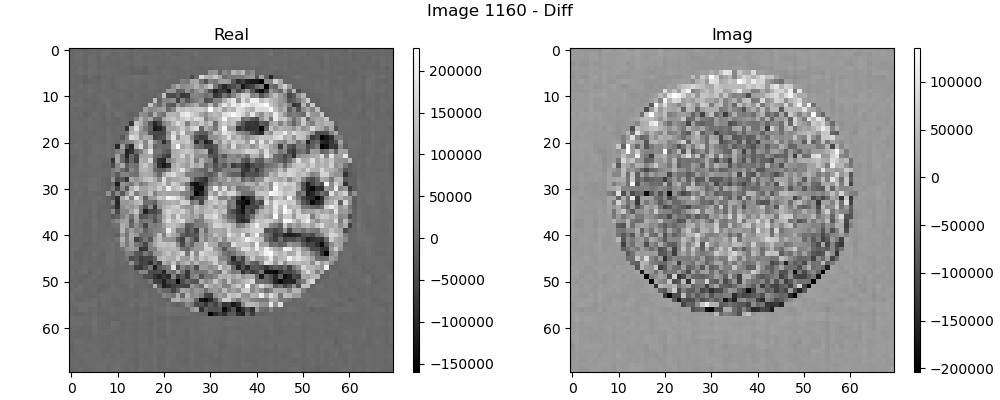

In [1024]:
# Saves only real and imaginary part
recon = recon_all.copy()

# Plot
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
fig.suptitle("Image %d - Diff" % im_id)

vmin, vmax = np.percentile(
    np.real(recon[roi[0] : roi[1], roi[2] : roi[3]]), (0.1, 99.9)
)
t_im1 = ax[0].imshow(
    np.real(recon[roi[0] : roi[1], roi[2] : roi[3]]), vmin=vmin, vmax=vmax, cmap="gray"
)
ax[0].set_title("Real")
plt.colorbar(t_im1, ax=ax[0], aspect=50)

vmin, vmax = np.percentile(
    np.imag(recon[roi[0] : roi[1], roi[2] : roi[3]]), (0.1, 99.9)
)
t_im2 = ax[1].imshow(
    np.imag(recon[roi[0] : roi[1], roi[2] : roi[3]]), vmin=vmin, vmax=vmax, cmap="gray"
)
ax[1].set_title("Imag")
plt.colorbar(t_im2, ax=ax[1], aspect=50)

# Save images
fname = join(
    folder_general,
    "Recon_ImId_%04d_RefId_%04d_%s_cdi_diff_small.png" % (im_id, topo_id, USER),
)
print("Saving: %s" % fname)
plt.savefig(fname, bbox_inches="tight", transparent=False)

# Stack processing

Here you can specify a list with multiple ids for automatic reconstruction and also process scans which contain multiple images. Each scan set needs to contain an image_id, topo_id and dark_id so than length of all list must be the same.    

In [1025]:
# Worker which performs complete reconstruction process
def worker(image, topo):
    # Define reference image
    ref_image = topo[
        roi_im_reg[0] : roi_im_reg[1], roi_im_reg[2] : roi_im_reg[3]
    ].copy()

    # Alignment data
    offset_image = image[
        roi_im_reg[0] : roi_im_reg[1], roi_im_reg[2] : roi_im_reg[3]
    ].copy()

    # Calculate relative shift between image and topo
    shift = cci.image_registration(offset_image, ref_image)
    shift_c = np.array(topo.shape) / 2 - center

    # Shift arrays and apply beamstop
    topo_c = cci.shift_image(topo, shift_c)
    topo_b = topo_c * mask_bs
    im_c = cci.shift_image(image, shift_c)
    im_b = im_c * mask_bs

    # Calculate difference and sum hologram
    factor, offset = cci.dyn_factor(
        im_b,
        topo_b,
        method="correlation",
        print_out=False,
        plot=False,
    )
    diff_c = im_c - factor * topo_c - offset  # centered but without beamstop
    diff_b = im_b - factor * topo_b - offset  # centered with beamstop
    sum_c = im_c + factor * topo_c - offset  # centered but without beamstop
    sum_b = im_b + factor * topo_b - offset  # centered with beamstop

    diff_b[np.abs(holo_filter) > 1e5] = 0

    # Do the reconstruction
    holo = diff_b.copy()
    recon = np.zeros(image.shape, dtype=np.complex_)

    # Reconstruct
    recon = cci.reconstruct(
        fth.propagate(holo, prop_dist * 1e-6, experimental_setup=experimental_setup)
        * np.exp(1j * phase)
    )

    # worker dictionary
    worker_dict = {}
    worker_dict["topo_centered"] = topo_c
    worker_dict["im_centered"] = im_c
    worker_dict["holo"] = holo
    worker_dict["sum"] = sum_b
    worker_dict["recon"] = recon
    worker_dict["factor"] = factor
    worker_dict["offset"] = offset

    return worker_dict

In [40]:
## Multiple Sets
im_id_set = [940, 941]
topo_id_set = [938, 938]
dark_id_set = ["none", "none", "none", "none", "none", "none", "none", "none"]

print("Dynamics Set: %s" % im_id_set)
print("Reference Set: %s" % topo_id_set)
print("Dark Set: %s" % dark_id_set)

Dynamics Set: [940, 941]
Reference Set: [938, 938]
Dark Set: ['none', 'none', 'none', 'none', 'none', 'none', 'none', 'none']


 
Loading imageId: 0940, topoId: 0938, darkId: none
Loaded: /asap3/petra3/gpfs/p04/2023/data/11016769/raw/nxs/2306_XPCS_00940.nxs (2 frames)
No padding needed!
Filling Infs and Nans...
Calculating mean...
Loaded: /asap3/petra3/gpfs/p04/2023/data/11016769/raw/nxs/2306_XPCS_00938.nxs (2 frames)
No padding needed!
Filling Infs and Nans...
Calculating mean...
Now Saving: /asap3/petra3/gpfs/p04/2023/data/11016769/processed/Data_ImId_0940_RefId_0938_cklose_stack_processing.hdf5
Saving: /asap3/petra3/gpfs/p04/2023/data/11016769/processed/Recon_ImId_0940_RefId_0938_cklose_single_stack_processing.png
 
Loading imageId: 0941, topoId: 0938, darkId: none
Loaded: /asap3/petra3/gpfs/p04/2023/data/11016769/raw/nxs/2306_XPCS_00941.nxs (2 frames)
No padding needed!
Filling Infs and Nans...
Calculating mean...
Loaded: /asap3/petra3/gpfs/p04/2023/data/11016769/raw/nxs/2306_XPCS_00938.nxs (2 frames)
No padding needed!
Filling Infs and Nans...
Calculating mean...
Now Saving: /asap3/petra3/gpfs/p04/2023/dat

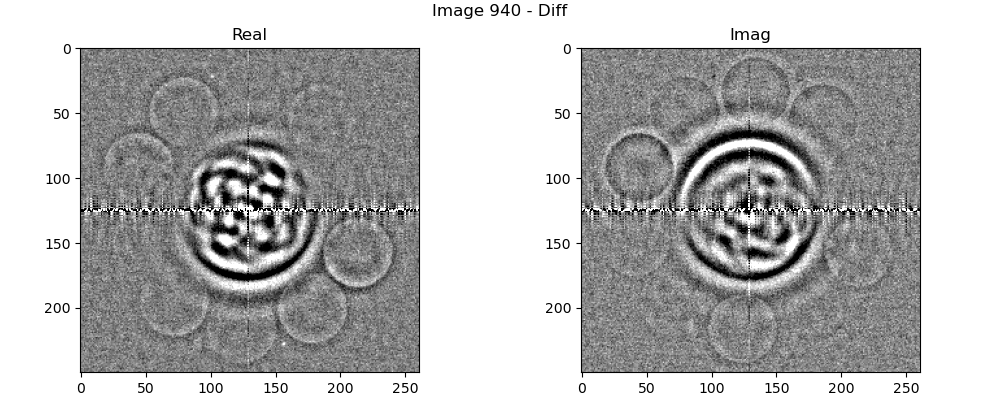

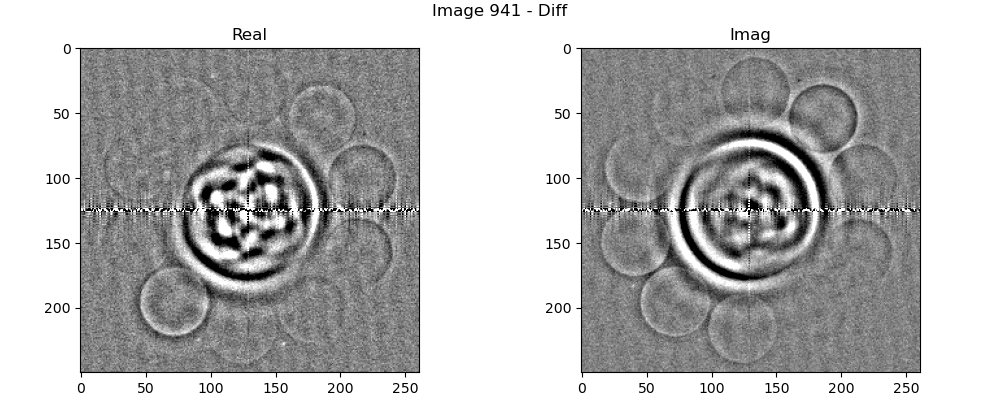

In [508]:
# Ugly Automatic processing of image stacks
recons = []
for it, im_id in enumerate(im_id_set):
    # Get also topo & dark id from list of sets
    topo_id = topo_id_set[it]
    dark_id = dark_id_set[it]
    print(" ")

    # Load data
    print(
        f"Loading imageId: %04d, topoId: %04d, darkId: %s" % (im_id, topo_id, dark_id)
    )
    image, _, _ = load_processing(im_id)
    topo, _, _ = load_processing(topo_id)

    if dark_id != "none":
        dark, _, _ = load_processing(dark_id)
        image = image - dark
        topo = topo - dark

    # Process images
    worker_dict = worker(image, topo)

    # Save h5
    data = {}
    data["im_id"] = im_id
    data["topo_id"] = topo_id
    data["topo_centered"] = worker_dict["topo_centered"]
    data["im_centered"] = worker_dict["im_centered"]
    data["holo"] = worker_dict["holo"]
    data["recon"] = worker_dict["recon"]
    data["factor"] = worker_dict["factor"]
    data["offset"] = worker_dict["offset"]
    data["center"] = center
    data["roi"] = roi
    data["prop_dist"] = prop_dist
    data["phase"] = phase
    data["mask_bs"] = mask_bs
    data["bs_diam"] = bs_diam

    filename = join(
        folder_general,
        "Data_ImId_%04d_RefId_%04d_%s_stack_processing"
        % (
            im_id,
            topo_id,
            USER,
        ),
    )
    print("Now Saving: %s.hdf5" % filename)
    cci.create_hdf5(data, join(folder_general, filename))

    recons.append(data["recon"])
    # Plot
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    fig.suptitle("Image %d - Diff" % im_id)
    vmin, vmax = np.percentile(
        np.real(data["recon"][roi[0] : roi[1], roi[2] + 10 : roi[3]]), (2, 98)
    )
    t_im1 = ax[0].imshow(
        np.real(data["recon"][roi[0] : roi[1], roi[2] : roi[3]]),
        vmin=vmin,
        vmax=vmax,
        cmap="gray",
    )
    ax[0].set_title("Real")
    vmin, vmax = np.percentile(
        np.imag(data["recon"][roi[0] : roi[1], roi[2] + 10 : roi[3]]), (2, 98)
    )
    t_im2 = ax[1].imshow(
        np.imag(data["recon"][roi[0] : roi[1], roi[2] : roi[3]]),
        vmin=vmin,
        vmax=vmax,
        cmap="gray",
    )
    ax[1].set_title("Imag")

    # Save images
    fname = join(
        folder_general,
        "Recon_ImId_%04d_RefId_%04d_%s_single_stack_processing.png"
        % (im_id, topo_id, USER),
    )
    print("Saving: %s" % fname)
    plt.savefig(fname, bbox_inches="tight", transparent=False)

Saving: /asap3/petra3/gpfs/p04/2023/data/11016769/processed/Recon_ImId_[940, 941]_RefId_[938, 938]_cklose_merged.png


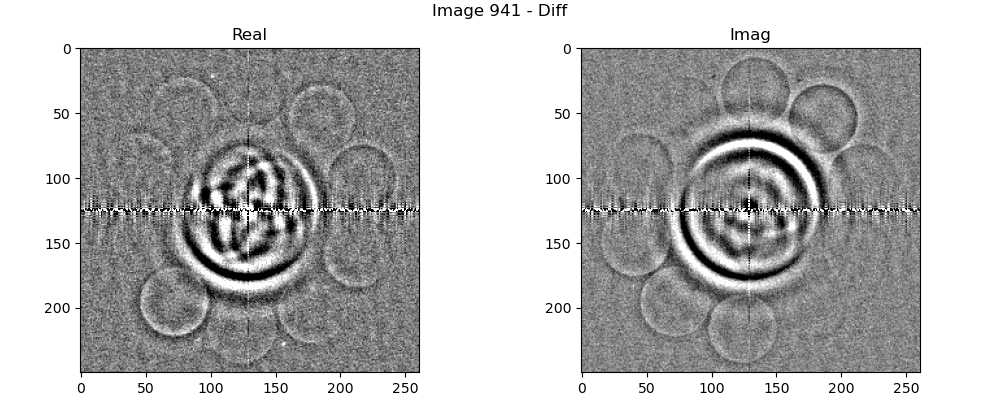

In [512]:
# Plot
recon = np.mean(np.array(recons), axis=0)
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
fig.suptitle("Image %d - Diff" % im_id)
vmin, vmax = np.percentile(
    np.real(recon[roi[0] : roi[1], roi[2] + 10 : roi[3]]), (2, 98)
)
t_im1 = ax[0].imshow(
    np.real(recon[roi[0] : roi[1], roi[2] : roi[3]]),
    vmin=vmin,
    vmax=vmax,
    cmap="gray",
)
ax[0].set_title("Real")
vmin, vmax = np.percentile(
    np.imag(recon[roi[0] : roi[1], roi[2] + 10 : roi[3]]), (2, 98)
)
t_im2 = ax[1].imshow(
    np.imag(recon[roi[0] : roi[1], roi[2] : roi[3]]),
    vmin=vmin,
    vmax=vmax,
    cmap="gray",
)
ax[1].set_title("Imag")

# Save images
fname = join(
    folder_general,
    "Recon_ImId_%s_RefId_%s_%s_merged.png" % (im_id_set, topo_id_set, USER),
)
print("Saving: %s" % fname)
plt.savefig(fname, bbox_inches="tight", transparent=False)